# Affective Computing HW2 - Clustering
## 1. Data Exploration

In [16]:
import os
import random
from shutil import copyfile
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from IPython.display import Image
import umap as up
from sklearn import decomposition,preprocessing
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score


In [2]:
IMG_PATH = "./faces/"
AU_PATH = "./faces/faces_AU.csv"
RES_PATH = "./support_images/"

### 1.1 OpenFaces Features
+ The meaning of each column could be found inside this website: https://github.com/TadasBaltrusaitis/OpenFace/wiki/Output-Format
+ All columns inside this dataframe is of type float and int.

In [3]:
df_au = pd.read_csv(AU_PATH)
df_au.head(3)

,Unnamed: 0,face,confidence,gaze_0_x,gaze_0_y,gaze_0_z,gaze_1_x,gaze_1_y,gaze_1_z,gaze_angle_x,...,AU14_c,AU15_c,AU17_c,AU20_c,AU23_c,AU25_c,AU26_c,AU28_c,AU45_c,img
0,0,0,0.975,0.849292,0.094088,-0.519471,-0.591967,0.265419,-0.761005,0.198,...,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,3
1,0,0,0.975,0.677182,0.186928,-0.711676,-0.270661,0.120869,-0.955057,0.239,...,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,5
2,0,0,0.975,0.625340,-0.066629,-0.777503,-0.619685,0.106816,-0.777548,0.004,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,6


In [4]:
df_au.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 507 entries, 0 to 506
Columns: 713 entries, Unnamed: 0 to img
dtypes: float64(710), int64(3)
memory usage: 2.8 MB


In [5]:
df_au.columns

Index(['Unnamed: 0', 'face', ' confidence', ' gaze_0_x', ' gaze_0_y',
       ' gaze_0_z', ' gaze_1_x', ' gaze_1_y', ' gaze_1_z', ' gaze_angle_x',
       ...
       ' AU14_c', ' AU15_c', ' AU17_c', ' AU20_c', ' AU23_c', ' AU25_c',
       ' AU26_c', ' AU28_c', ' AU45_c', 'img'],
      dtype='object', length=713)

In [6]:
# check the number of different values for each column
print(df_au. nunique())
print("Unamed: 0 unique values: ", df_au['Unnamed: 0'].unique())
print("face unique values: ", df_au['face'].unique())

Unnamed: 0       3
face             3
 confidence     10
 gaze_0_x      506
 gaze_0_y      505
              ... 
 AU25_c          2
 AU26_c          2
 AU28_c          2
 AU45_c          2
img            500
Length: 713, dtype: int64
Unamed: 0 unique values:  [0 1 2]
face unique values:  [0 1 2]


### 1.2 Facial Imgaes
+ Total 500 hundread of generated facial images.

In [7]:
img_fns = os.listdir(IMG_PATH)
img_fns = [s for s in img_fns if s.endswith(".jpg")]
print(img_fns[:5])
print("number of images: ", len(img_fns))

['000003.jpg', '000005.jpg', '000006.jpg', '000007.jpg', '000011.jpg']
number of images:  500


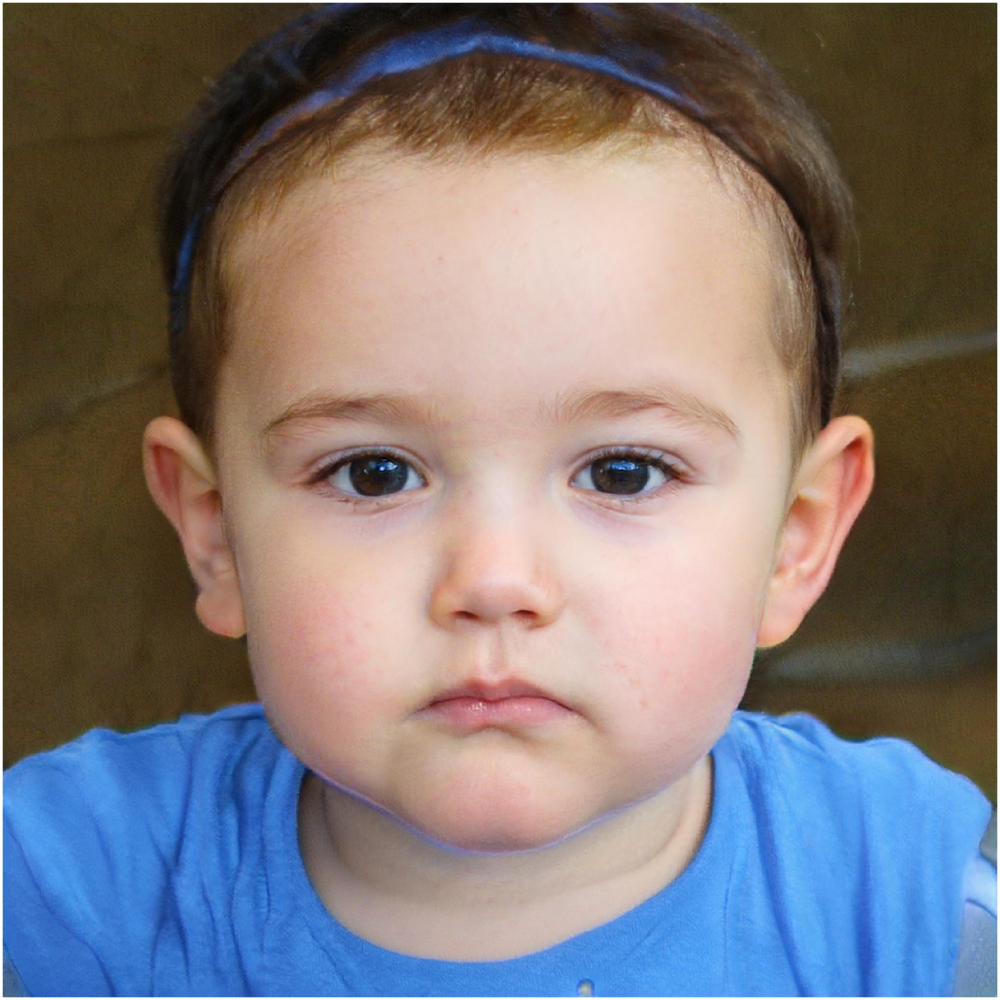

In [8]:
Image(filename=IMG_PATH + img_fns[0], width= 300)

### 1.3 Check file name matching
+ Make sure image data and feature data has a perfect one-to-one macthing.

In [9]:
au_index = set(df_au['img'].tolist())
img_index = set([int(fn[:-4]) for fn in img_fns])

print("au data size: ", len(au_index))
print("image date size: ", len(img_index))
print("two dataset matching size: ", len(au_index.intersection(img_index)))


au data size:  500
image date size:  500
two dataset matching size:  500


# 2. Visualizing Unlabeled Training Data.
> You are provided some unlabeled data in faces.csv. Carefully select the features you wish you use, and using Principal Component Analysis, plot your data points in 2 dimensions. What is the explained variance for each component? Hint: Use sklearn's libraries and call StandardScaler before doing PCA.

## 2.1 Standarization
PCA serves to find the maximum variance direction, and it will be affected by the difference of scaling. A standarization on features should be performed before a PCA is applied.

In [12]:
# %conda install scikit-learn

In [10]:
# select feature columns
df = df_au.drop(['Unnamed: 0', 'face', ' confidence', 'img'], axis = 1)

# standardrizing all feature columns
scaler = preprocessing.StandardScaler().fit(df)
df_norm = scaler.transform(df)

df_norm = pd.DataFrame(df_norm, columns= df.columns)

## 2.2 Feature Selection
+ The original data contains over 700 features, and not all of them is relavent to our facial claustering tas. Therefore, I need to handpick some features.
+ OpenFace documentation for the columns: https://github.com/TadasBaltrusaitis/OpenFace/wiki/Output-Format
+ There are several different groups of features included: **Gaze related**: eyeball position, **Pose**: human head position in the frame, **Landmarks locations in 2D**, **Landmarks locations in 3D**, **Rigid and non-rigid shape parameters**: describe the rigid face shape (location, scale and rotation) and non-rigid face shape (deformation due to expression and identity), **Facial Action Units**. Among which, I select shape parameters and facial action units as they are the most related to facial expressions.

For our facial expression task, I selected **gaze related** features and the **Facial Action Units**. The gaze direction indicates different types of expressions, for example when people are happy and trying to seek connections, they usually look directly at the camera, but if they are upset, they usually avoid eye contact. The faicial Action Units is a standard encoding for describing human facial expression, thus those features are alson chosen in this case.

In [12]:
# selected feature column names
sparams = [' p_scale', ' p_rx', ' p_ry', ' p_rz', ' p_tx', ' p_ty']
sparams += [' p_' + str(i) for i in range(34)]

aus = [f for f in df_norm.columns if f.startswith(" AU") and f.endswith("_r")]

gazes = [f for f in df_norm.columns if f.startswith(" gaze")]

l2ds = [" x_" + str(i) for i in range(68)] + [" y_" + str(i) for i in range(68)]
l3ds = [" X_" + str(i) for i in range(48,68)] + [" Y_" + str(i) for i in range(48,68)] + [" Z_" + str(i) for i in range(48,68)]  

sel_features = gazes + aus

# filter
df_norm_pick = df_norm.loc[:, sel_features]
df_norm_pick.head()

,gaze_0_x,gaze_0_y,gaze_0_z,gaze_1_x,gaze_1_y,gaze_1_z,gaze_angle_x,gaze_angle_y,AU01_r,AU02_r,...,AU10_r,AU12_r,AU14_r,AU15_r,AU17_r,AU20_r,AU23_r,AU25_r,AU26_r,AU45_r
0,1.157998,0.358973,0.899223,-0.465866,1.205819,0.156067,0.606372,0.894397,-0.988464,-0.733469,...,-1.474474,-1.224819,-1.139310,0.849912,0.790379,-0.145960,-0.658276,-1.109118,-1.092031,-0.575688
1,0.624171,0.985978,0.176078,0.669744,0.009359,-0.736017,0.746040,0.380604,-0.937701,0.384640,...,0.026176,-1.224819,-1.139310,-0.879191,-0.745089,-0.688987,-0.658276,-0.119387,0.348541,-0.575688
2,0.463375,-0.726446,-0.071588,-0.563831,-0.106960,0.080017,-0.054498,-0.505831,-0.328542,-0.733469,...,-0.024867,0.403234,0.890861,-0.063576,-0.745089,3.411805,1.071710,-0.422032,-0.569471,0.752520
3,0.694237,-1.242252,0.220361,-0.294170,1.126375,-0.021143,0.286157,-0.229173,0.331379,-0.733469,...,-1.270304,-0.625010,0.333559,-0.243011,-0.745089,0.734119,-0.658276,-1.043681,0.433280,-0.372767
4,1.180525,0.125575,0.925036,0.611855,0.044470,-0.711450,1.195705,0.058777,0.229853,-0.733469,...,-0.851756,-1.148653,-1.139310,1.208782,-0.116943,0.116192,-0.658276,-1.109118,0.405034,-0.575688


## 2.3 PCA
+ Here we choose to use Principle Component Decomposition(PCA) as the dimension reduction method.
+ Usually we need to choose the number of component we want to keep( or the percentage of variance the remaining features could explain), but since we want to plot it into a 2 dimensional space, this problem is fixed.

**Observation**
+ The new generated two features only explain about 30% of the variance in total, which indicates the poor separation of the data points.

In [15]:
pca = decomposition.PCA(n_components=2, random_state = 0)
pca.fit(df_norm_pick)
df_pca = pca.transform(df_norm_pick)

df_pca = pd.DataFrame(df_pca)
df_pca.head(3)

,0,1
0,-1.873280,-1.897438
1,-1.009286,-2.049593
2,1.118445,0.900491


In [16]:
# check new feature variance ratio
print(pca.explained_variance_ratio_)

[0.18095609 0.12402915]


## 2.3 Visualization
+ Visualize the reduced data.

**Observation**
+ As we analyzed the variance ratio, we already know that data points are going to be crowded together with very limit separation. And from the visualization results, this is the case. With one large clsuter grouping in the center of the plot, and few outliers scattering around the main cluster.
+ It is not sure that whether these outliers belongs to the main group, or they are small clusters. Further explorations are needed.

[]

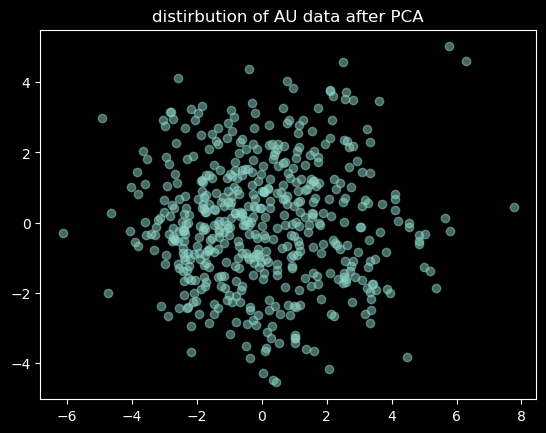

In [17]:
plt.scatter(df_pca[0], df_pca[1], alpha=0.5)
plt.title("distirbution of AU data after PCA")
plt.plot()

# 3. K-Means and Silhouette Score.
>Using the PCA-reduced data (i.e, now each point is represented by 2 numbers), perform K-Means clustering and calculate a silhouette score for various values of K. Plot the scores for easier visualization. What is the optimal silhouette score that you find, and with which value of K? What does this signify?

## 3.1 K-means Clustering
+ From the previous visualization result, we still do not know exactly how many groups of facial expressions are there. To tacle this problem, I decided to test k in the range of 2~10.

In [18]:
estimators = [
	KMeans(n_clusters=i) for i in range(2,11) 
]
n_clusters = [i for i in range(2,11)]
silhouette_scores = []

for est in estimators:
	est.fit(df_pca)
	labels = est.labels_
	# silhouette score for all samples
	silhouette_avg = silhouette_score(df_pca, labels)
	silhouette_scores.append(silhouette_avg)

d:\Anacoda\envs\cmpt733\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
d:\Anacoda\envs\cmpt733\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
d:\Anacoda\envs\cmpt733\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
d:\Anacoda\envs\cmpt733\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_

## 3.2 Visualization of Silhouette Score
+ In order to compare the clustering performance of different number of cluster selected, here we use Sihouette score to measure. Silhouette score measures the similarity of data points within a cluster, and the difference of data points in different clusters. The range of Silhouette score is [-1, 1], a larger value indicates better clustering results.

**Observation**
+ From the line chart below, it is obvious that when cluster number is set to 2, the Silhouette score is the highest. But an interesting peak is reach when k is set to 6 and 10. A further inspection on the these high Silhouette score k values should be done in order to see which number of cluster yield a more reasonable clustering result.

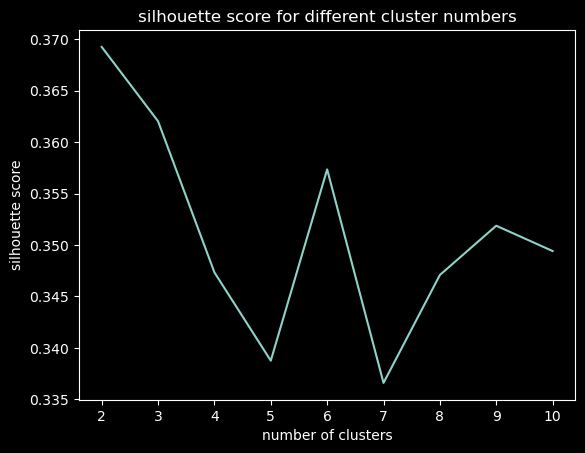

In [19]:
# plot sillhouette scores
plt.plot(n_clusters, silhouette_scores)
plt.title("silhouette score for different cluster numbers")
plt.xlabel("number of clusters")
plt.ylabel("silhouette score")
plt.show()

# 4. Cluster Interpretation.
>Use your chosen K from Part 2 and visualize the clusters as calculated using K-Means. In other words, each point should now be coloured based on the cluster it belongs to. Using the faces image folder provided, inspect the clusters and the corresponding images. What labels can you propose for the clusters? 

## 4.1 Visualization of the labeled clusters
+ Here I still use the PCA reduced data in 2.3, but this time with K-means labels.
+ In 3.2, I cannot get a satisfying cluster number from silhouette score only, so in this part, I decide to visualization the clusters for k = 2, 6, 10.

**Observations**
+ From the visualization result, when k is set to 6 and 10 are more plausible results, because some clusters are separates by a small gap while k equals 2 does not have have a cluster separation like this. 
+ Between 6 and 10, I tends to choose 6, because we already know that with the increase of number of clusters, Silhouette score is also going to increase in the end. So I believe the increase in the score from k = 9 is due to this reason. **Thus I choose 6 as my final number of clusters.**

In [33]:
# mapping number of clusters to the estimator index
ce_map = {n_clusters : n_clusters-2 for n_clusters in range(2, 11)}

In [21]:
def vis_cluster(n_cluster = 2):
	est = estimators[ce_map[n_cluster]]
	labels = labels = est.labels_
	plt.scatter(df_pca[0], df_pca[1], alpha=1, c=labels)
	plt.title("K-means clustering data visualization with "+str(n_cluster)+" clusters")
	plt.plot()

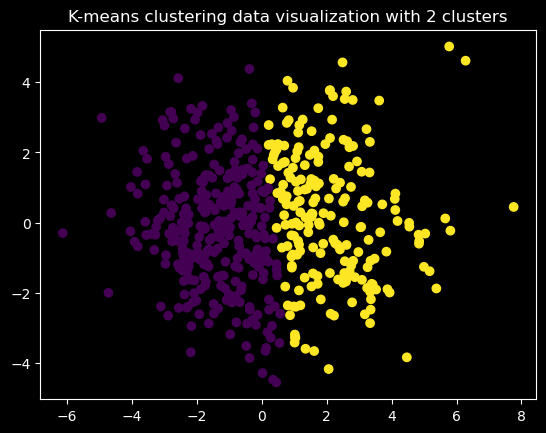

In [22]:
vis_cluster(n_cluster= 2)

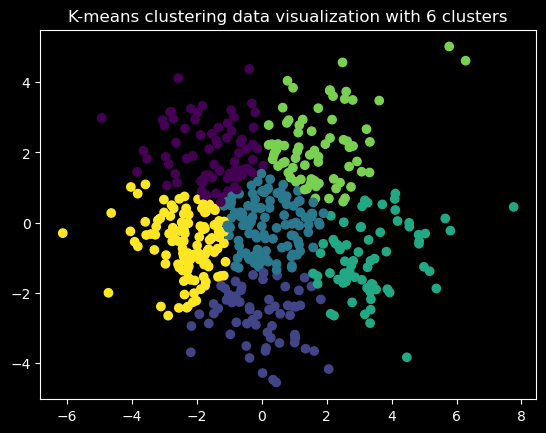

In [23]:
vis_cluster(n_cluster= 6)

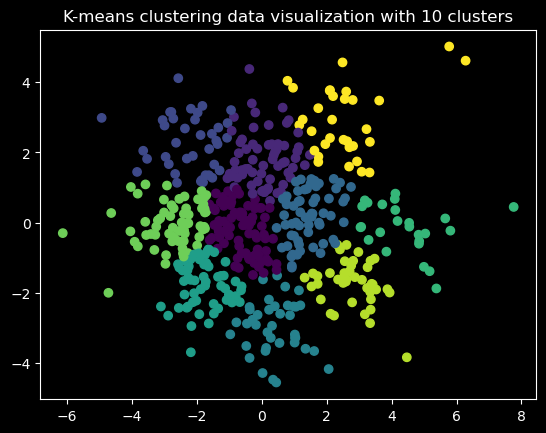

In [24]:
vis_cluster(n_cluster= 10)

## 4.2 Labeling the clusters
+ To label the cluster yields by K-Means, I need to see some sample images from each cluster.
+ This process can also help me examine the performance of the clustering result.

**Observations**
+ From the samples inside each group, it is obvious that different kinds of facial expressions are still mixing together. For example, in cluster 1, 1 happy faces is clustered with a neutrual face and a unhappy face. And happy faces appear in at least 4 different clutsers. These observations indicate that the clustering result does not separate different facial expressions as we want. 
+ An isnpection with finer granularity is needed in order to label each cluster.

In [25]:
# return random indexes of images from the a selected group with a selected label
def sample_images(n_cluster = 2, samples = 3, sel_label = 0):
	est = estimators[ce_map[n_cluster]]
	labels = est.labels_
	# randomly select image from the group
	indices = [i for i, val in enumerate(labels) if val == sel_label]
	if len(indices) <= samples:
		return indices
	else:
		selected_indices = random.sample(indices, samples)
		return selected_indices

def show_sample_image(indexs):
	selected_image_filenames = [IMG_PATH + img_fns[i] for i in indexs]
	images = [Image(filename=filename, width=300) for filename in selected_image_filenames]
	display(*images)

### 4.2.1 Cluster 1 samples

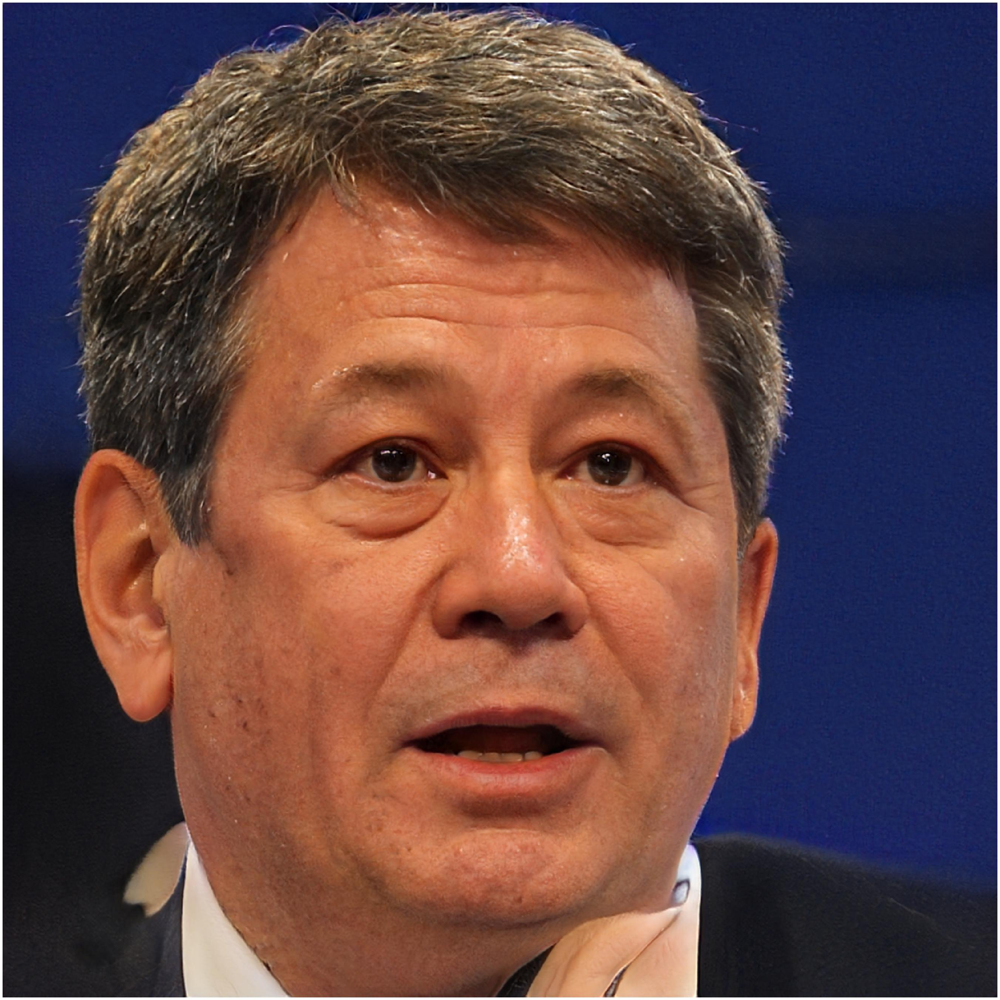

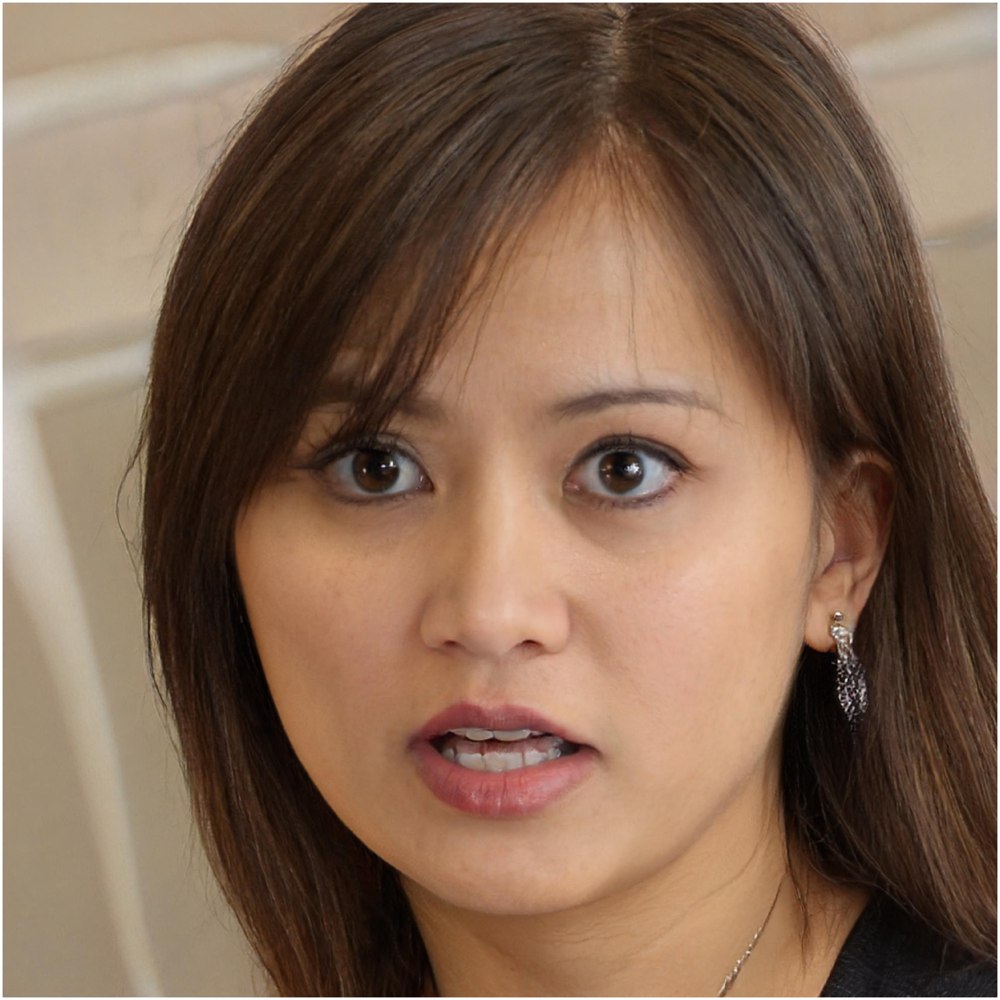

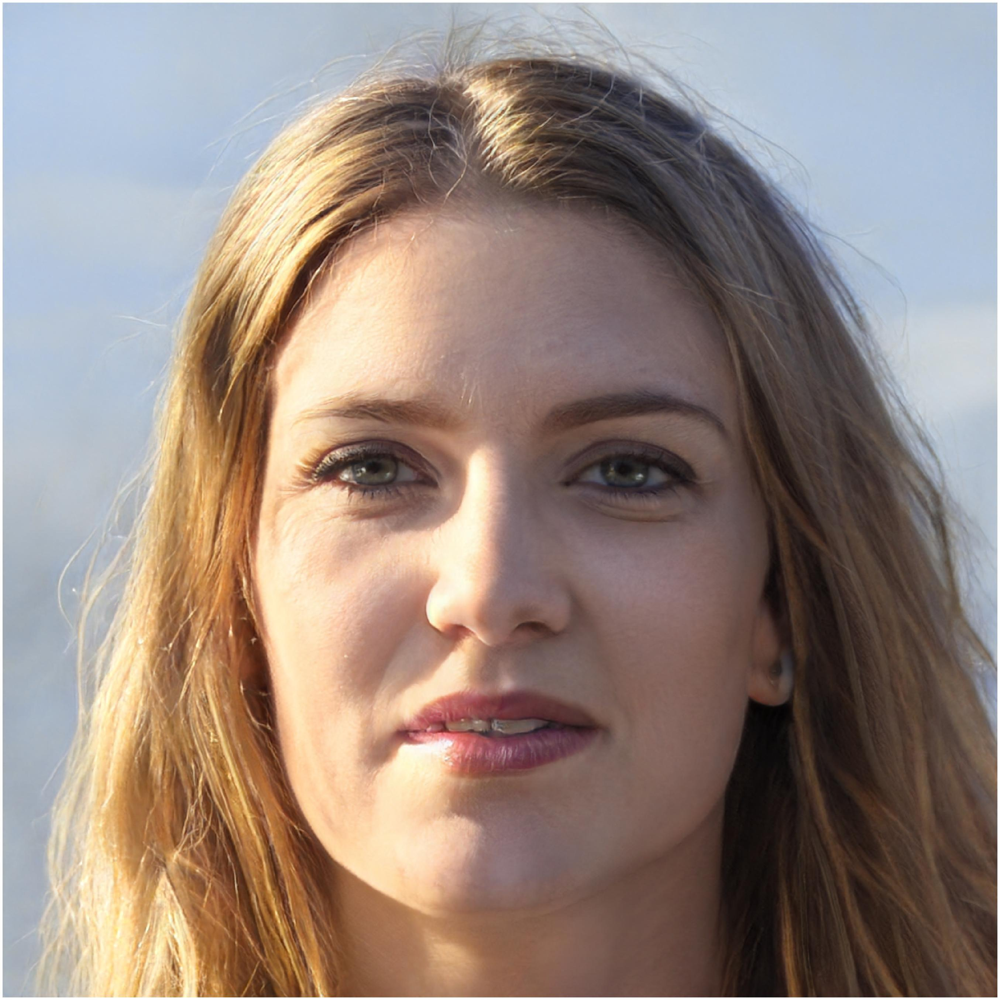

In [26]:
indexs = sample_images(n_cluster = 6, samples = 3, sel_label = 0)
show_sample_image(indexs)


### 4.2.2 Cluster 2 samples

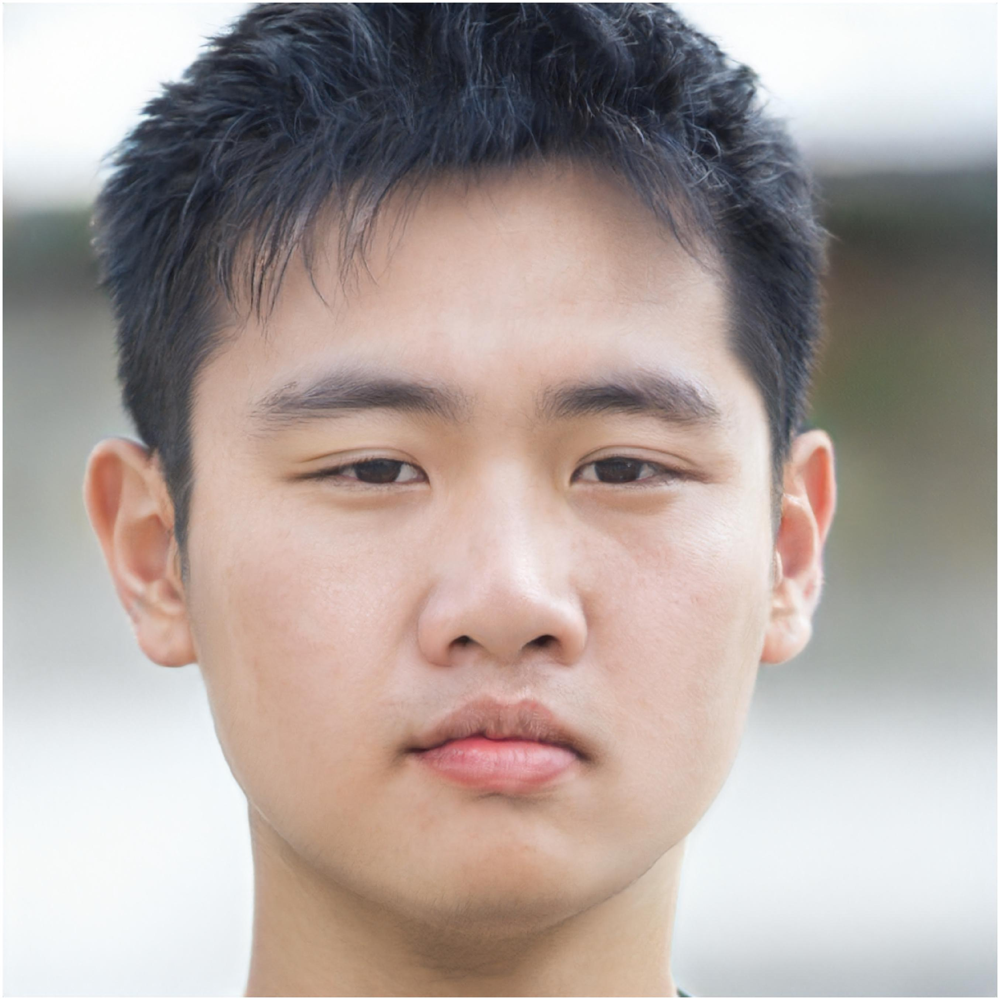

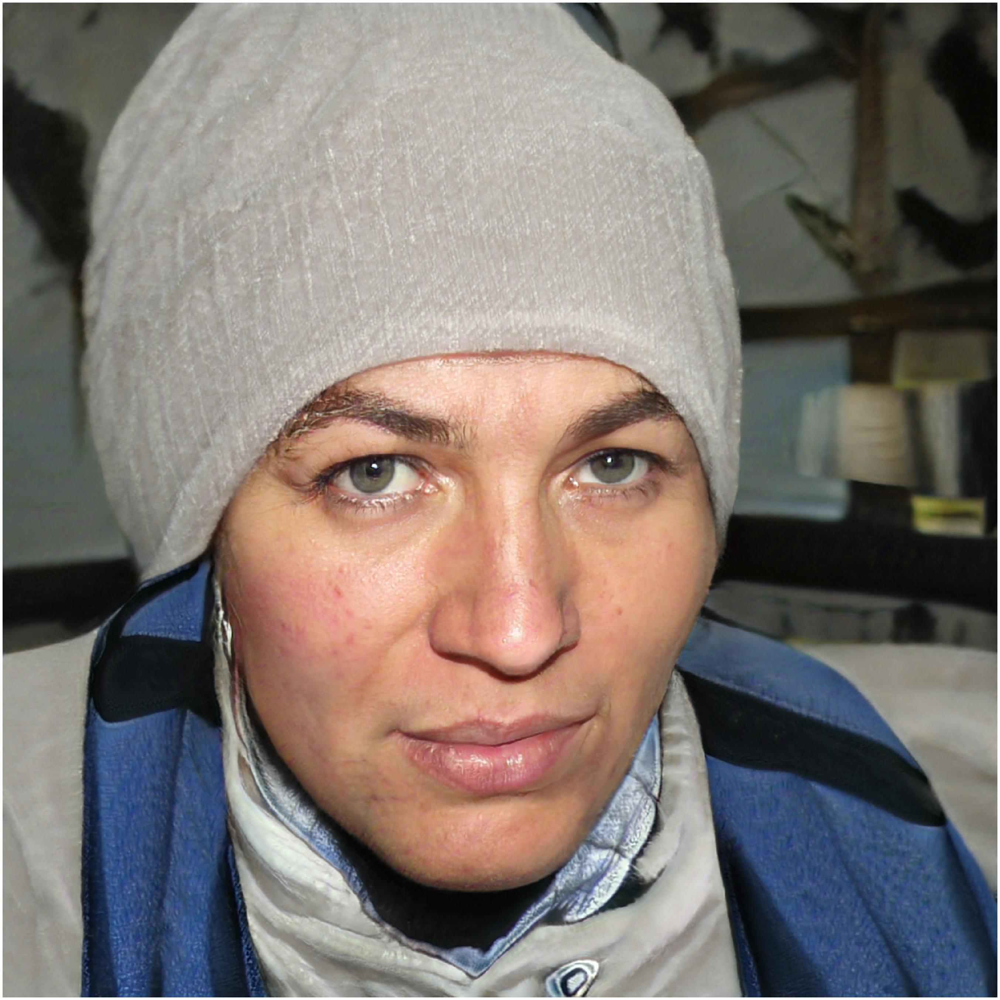

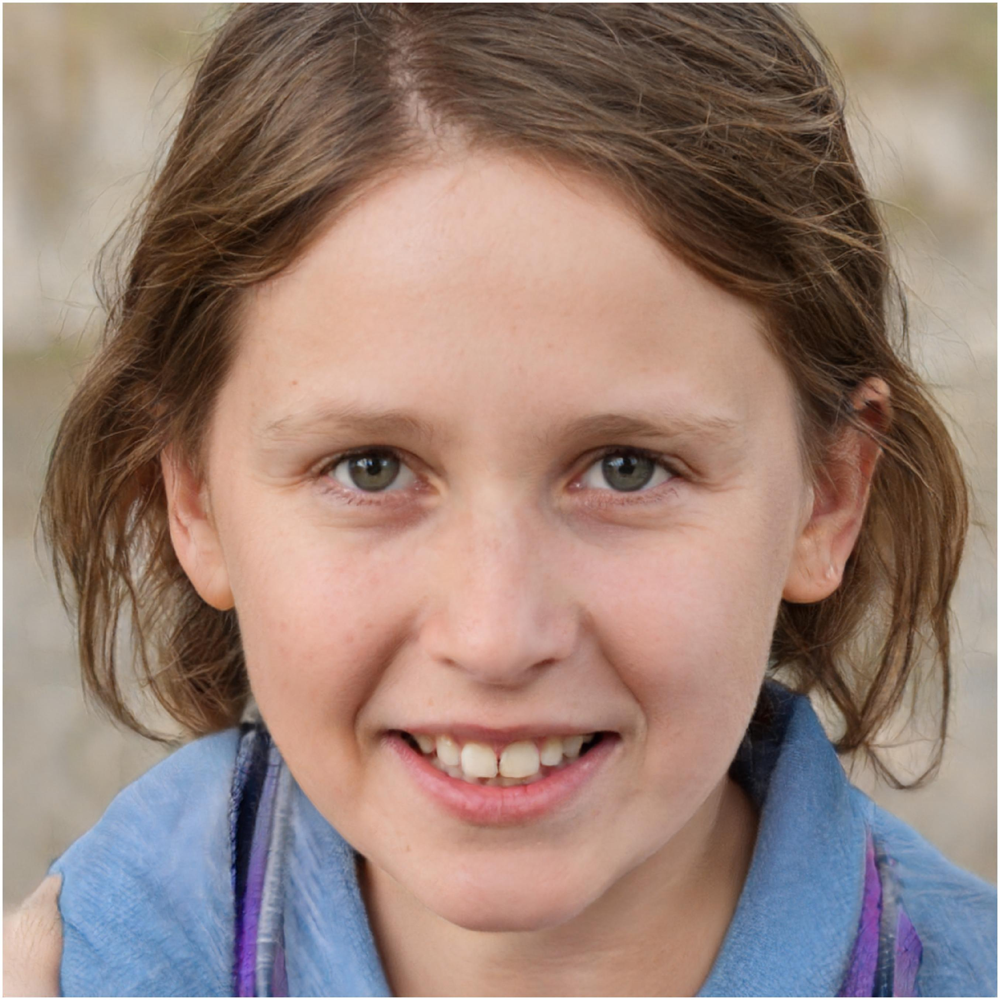

In [27]:
indexs = sample_images(n_cluster = 6, samples = 3, sel_label = 1)
show_sample_image(indexs)

### 4.2.3 Cluster 3 samples

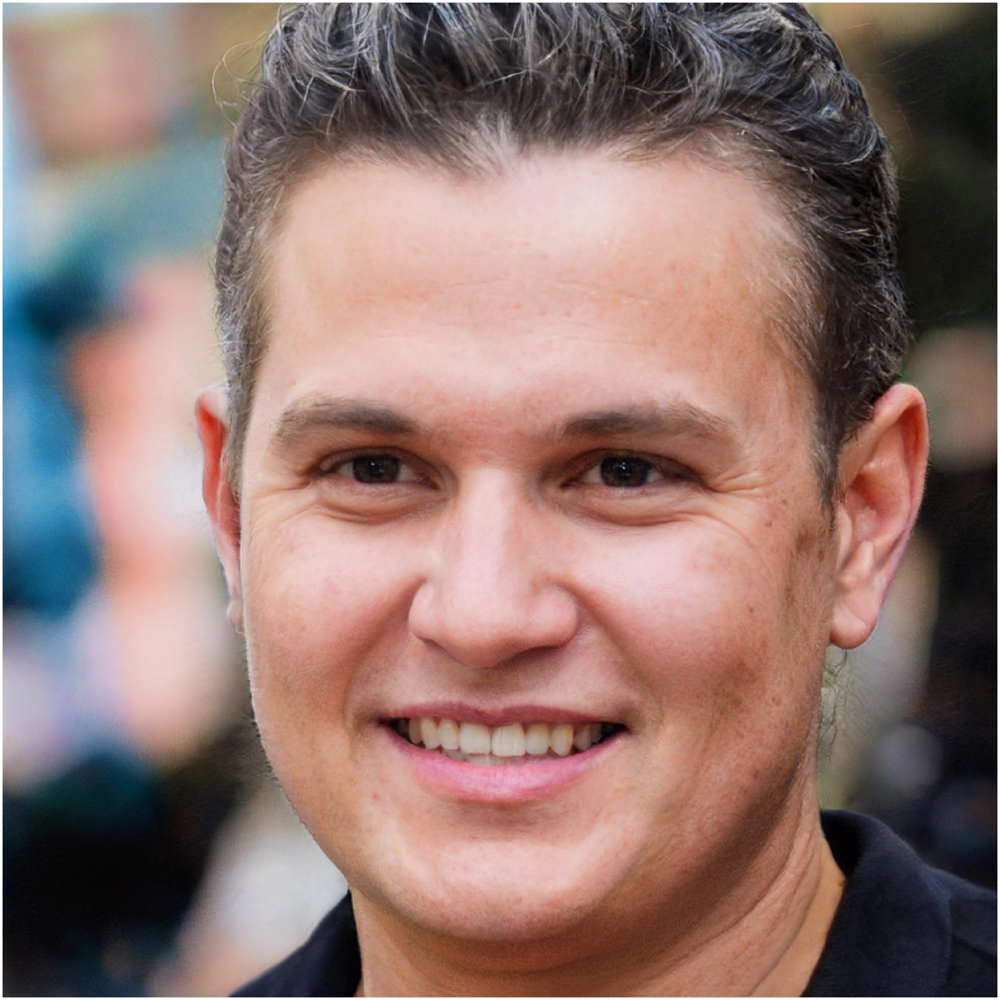

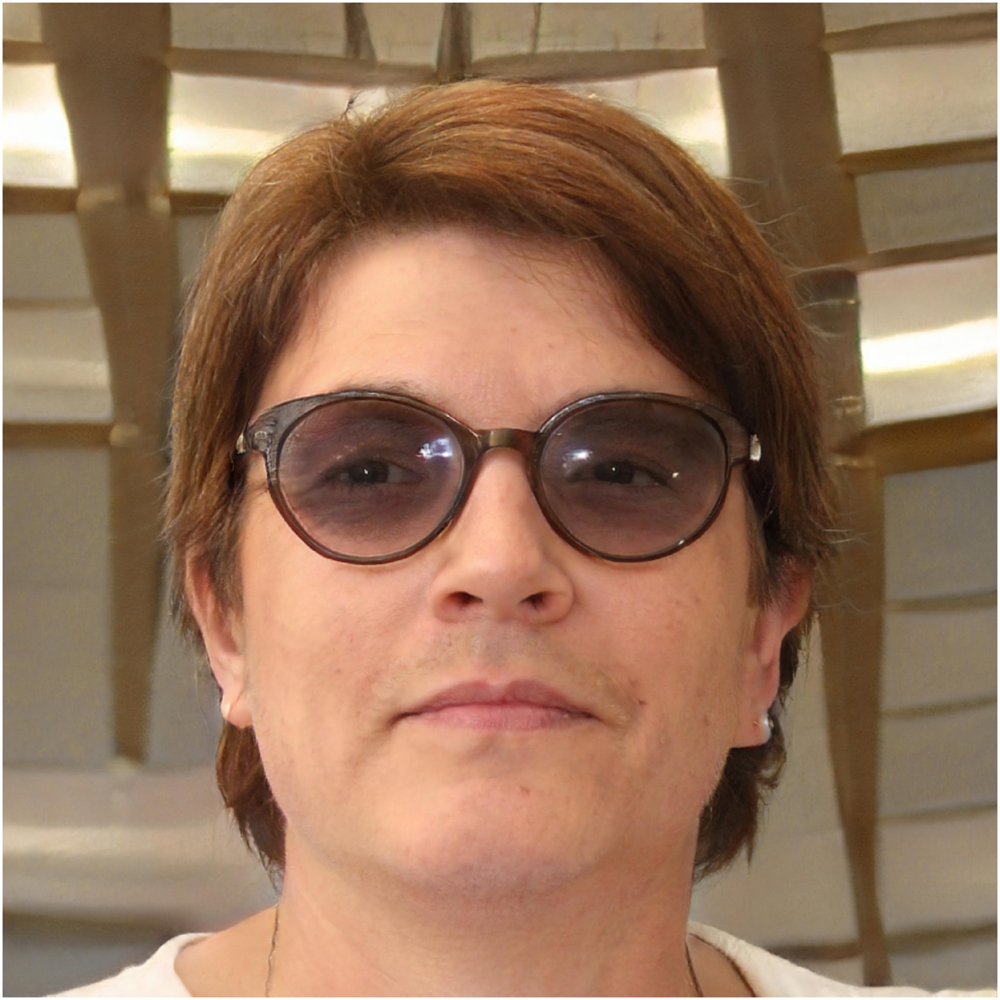

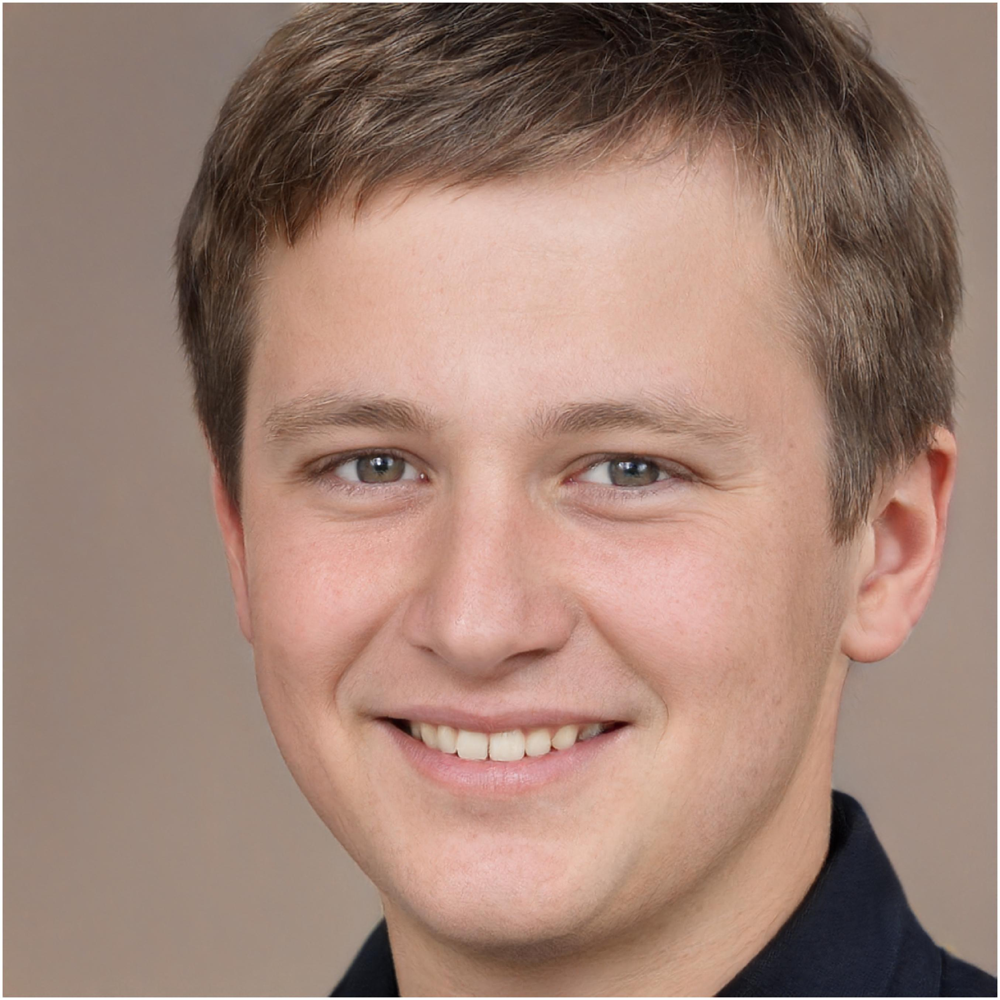

In [28]:
indexs = sample_images(n_cluster = 6, samples = 3, sel_label = 2)
show_sample_image(indexs)

### 4.2.4 Cluster 4 Samples

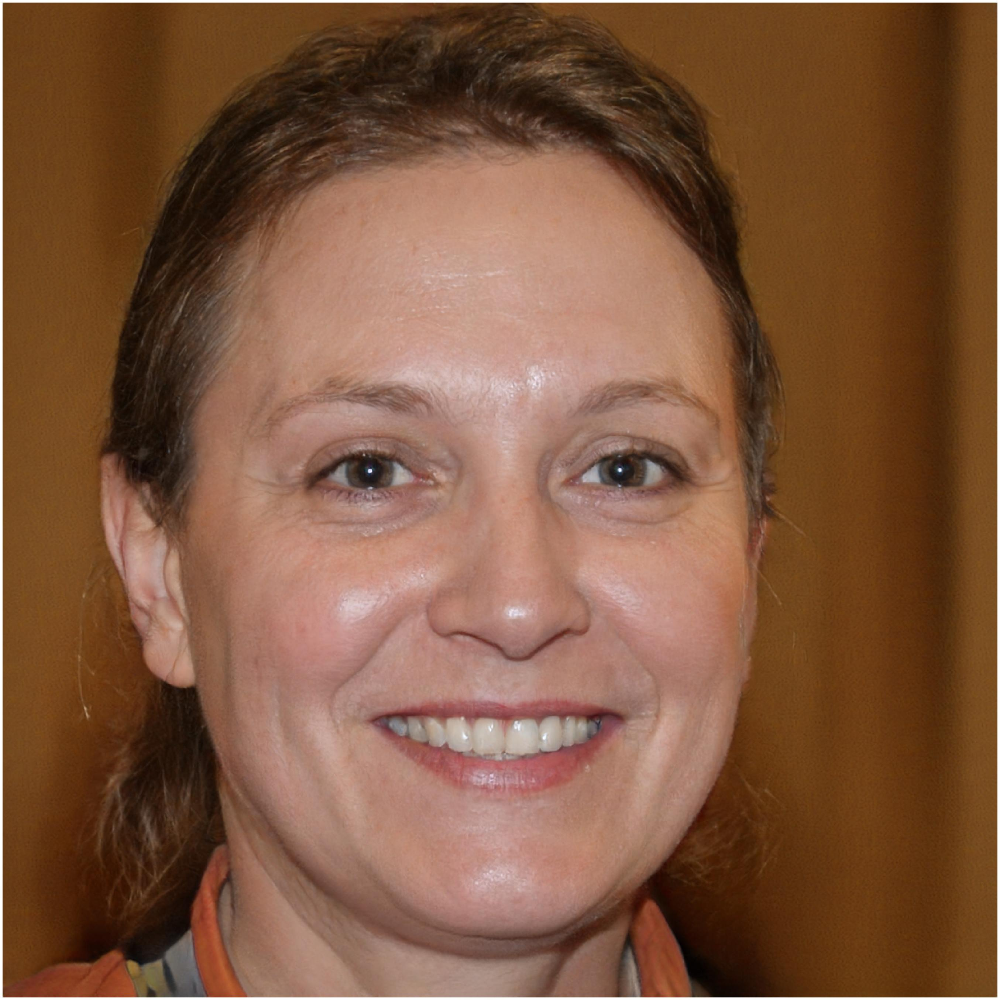

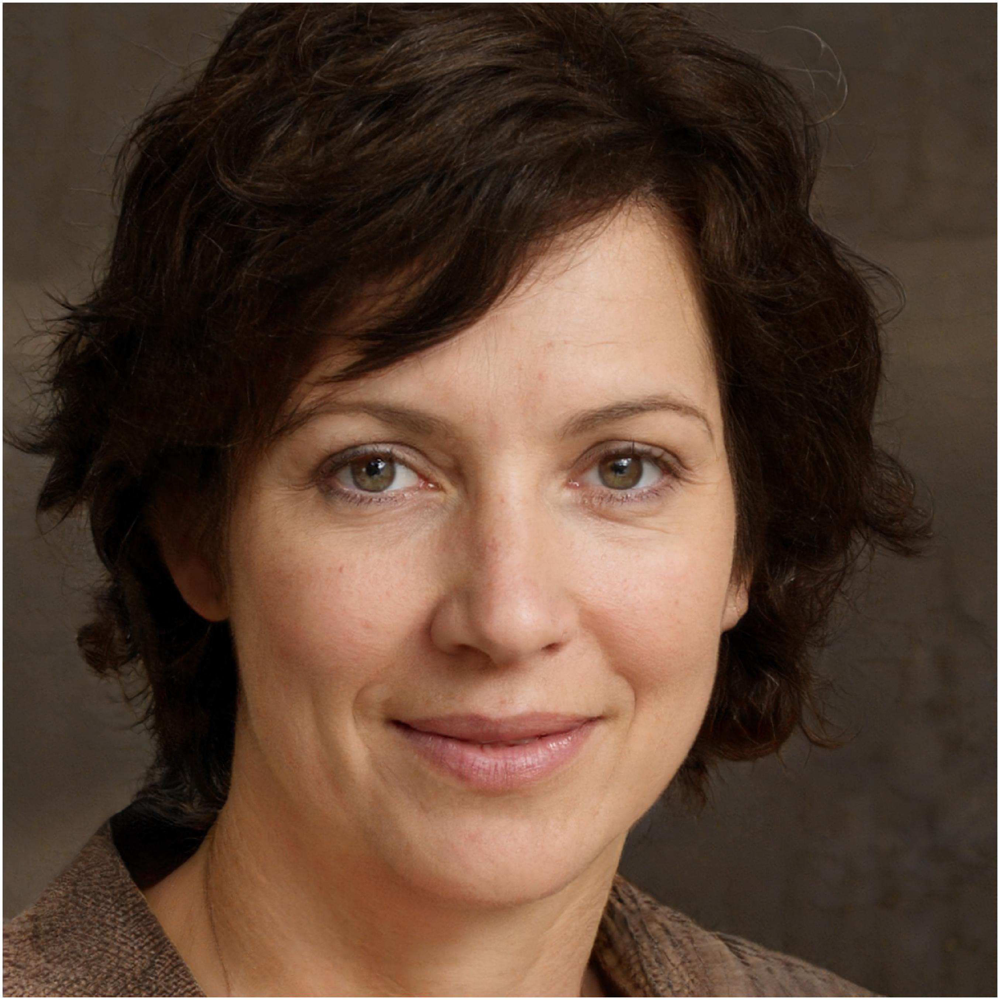

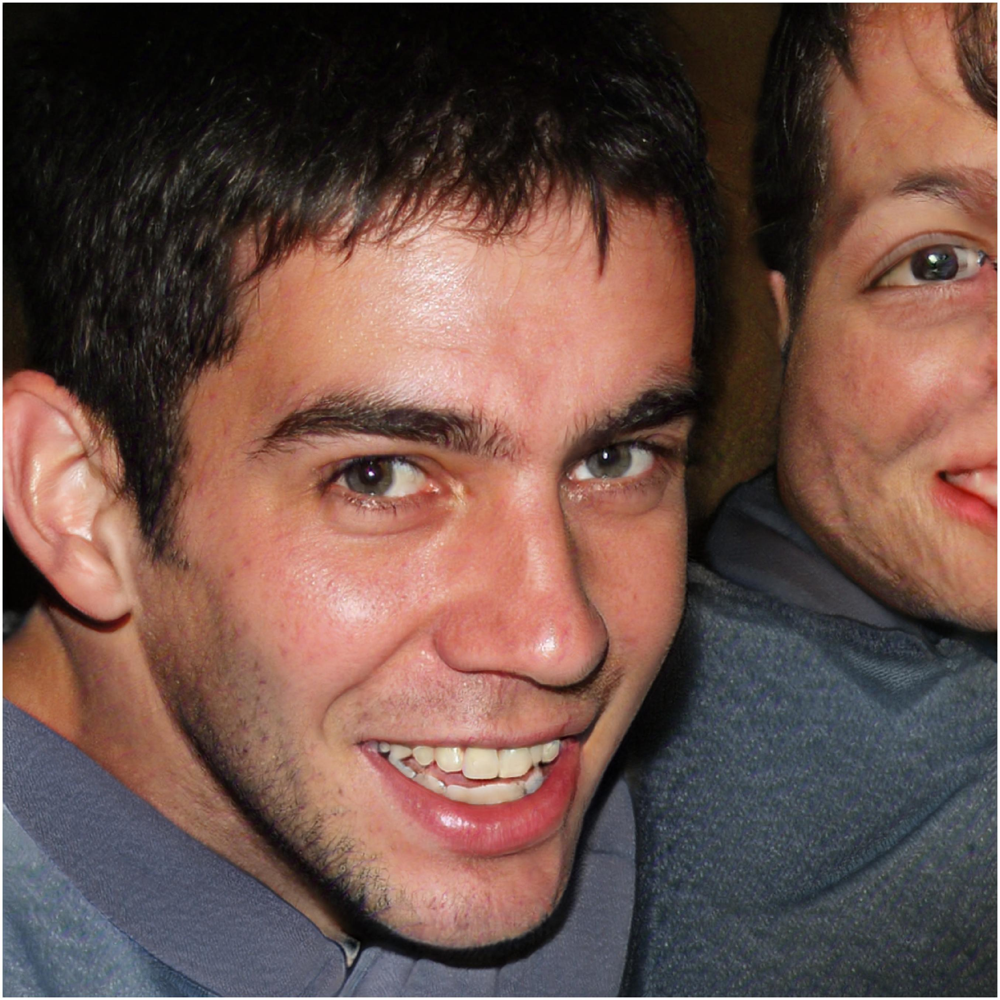

In [29]:
indexs = sample_images(n_cluster = 6, samples = 3, sel_label = 3)
show_sample_image(indexs)

### 4.3.5 Cluster 5 Samples

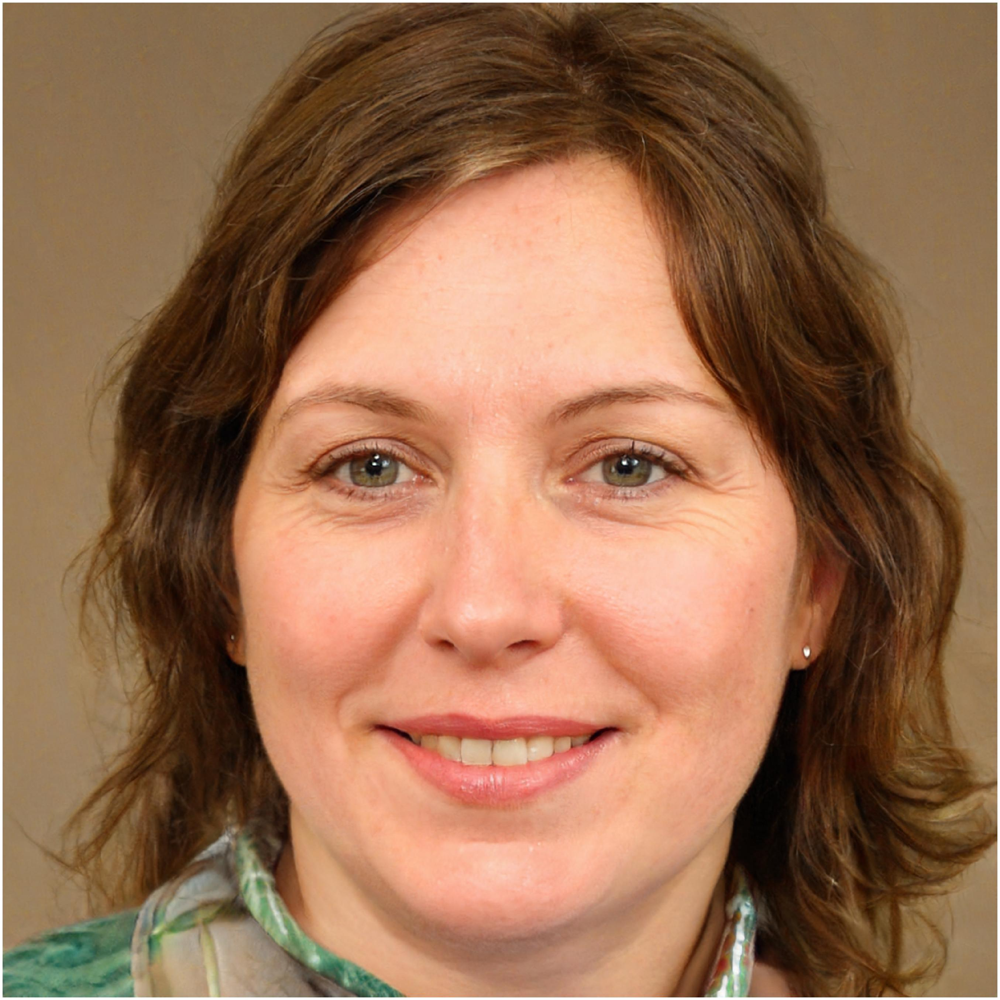

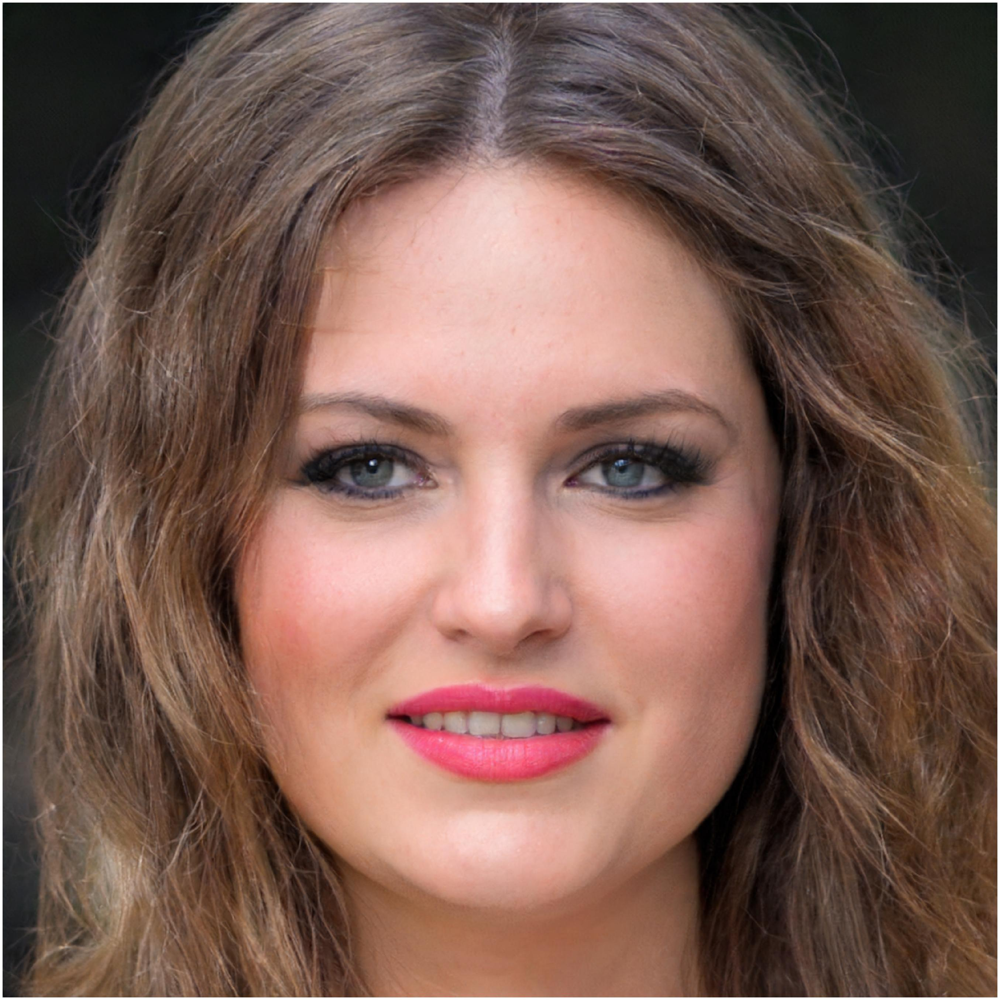

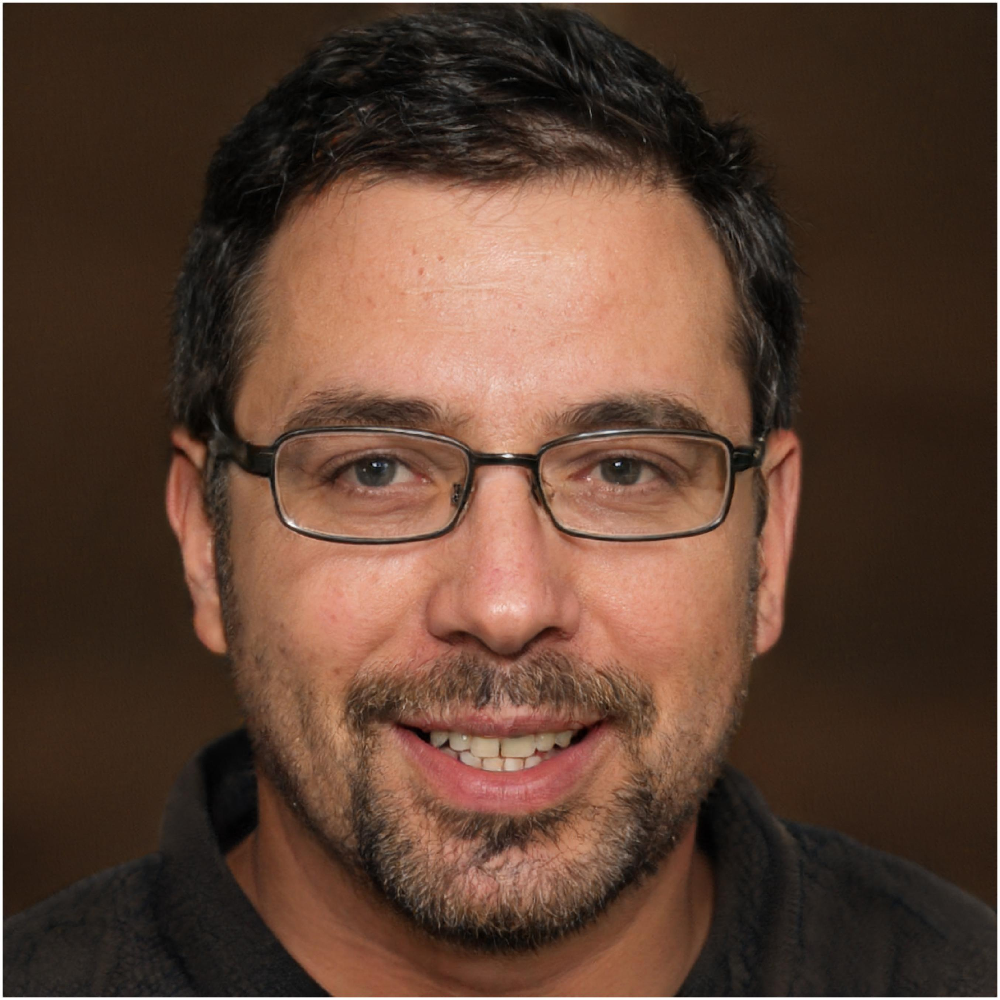

In [30]:
indexs = sample_images(n_cluster = 6, samples = 3, sel_label = 4)
show_sample_image(indexs)

### 4.2.6 Cluster 6 samples

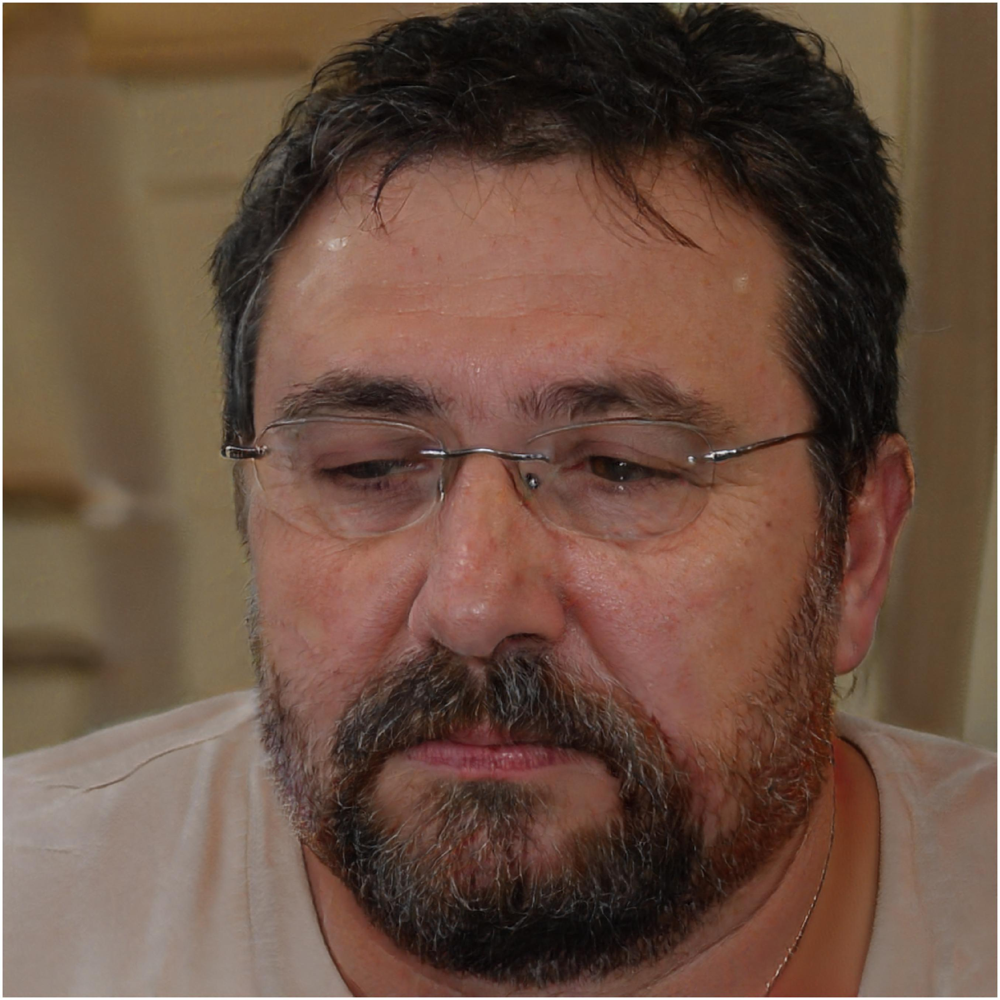

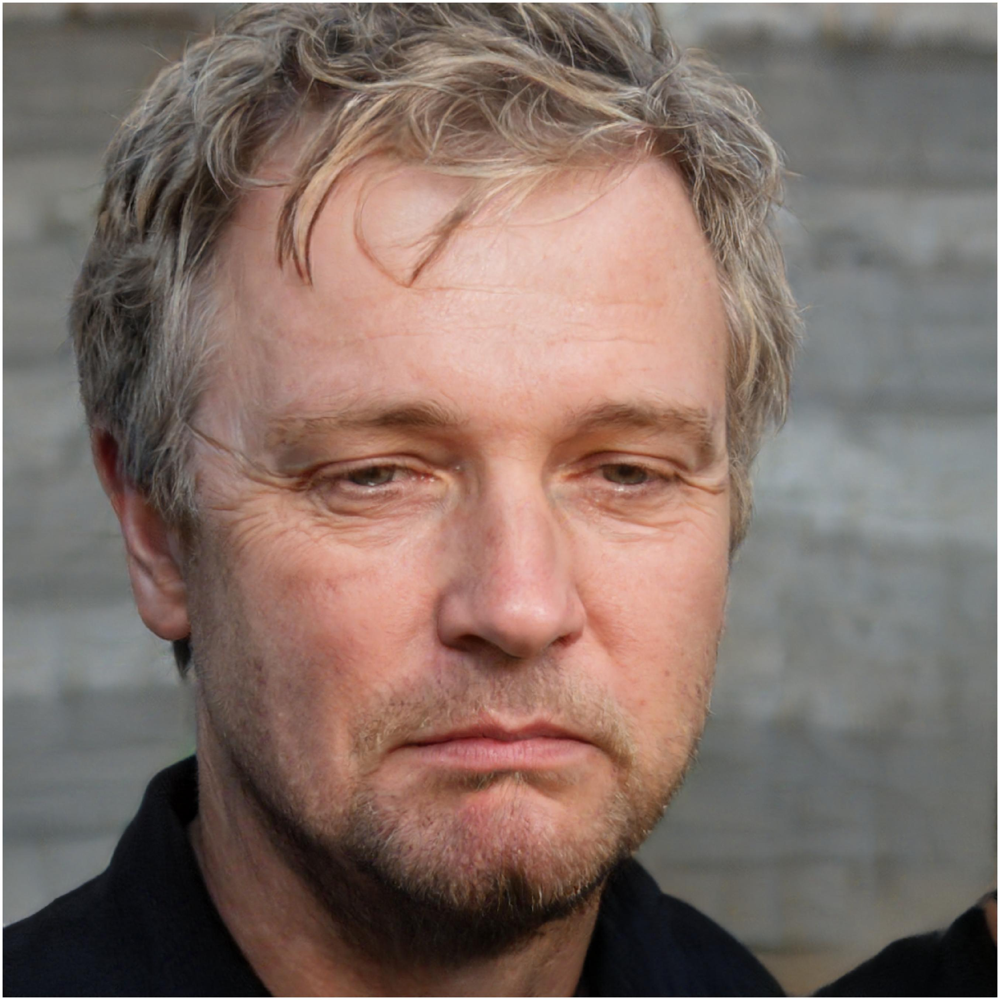

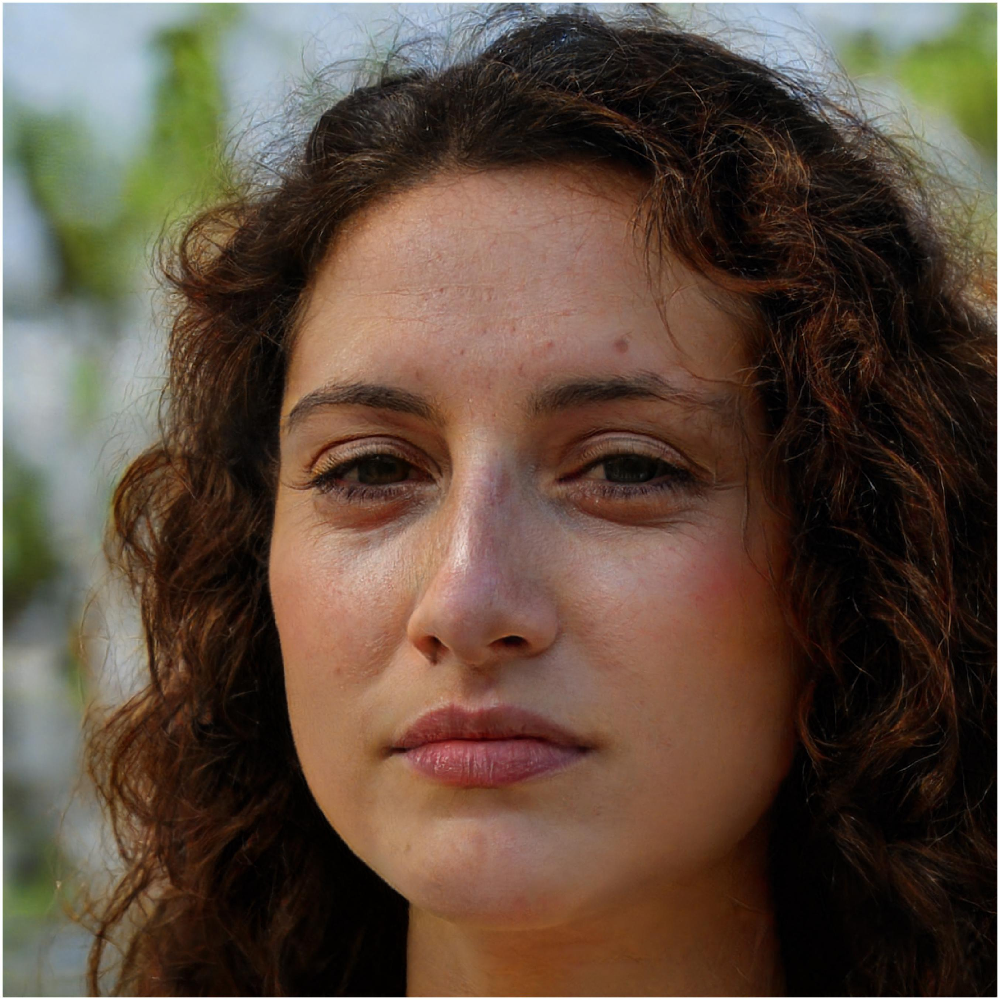

In [32]:
indexs = sample_images(n_cluster = 6, samples = 3, sel_label = 5)
show_sample_image(indexs)

### 4.2.7 One-by-one Inspection of each class & labeling
From the previous sampling, it is hard to give each cluster a label. So here I decide to store the image according to their cluster label, and inspect each group's images one by one. Then I can give each group a label according to the majority expression within that group. **You can refer to the images inside support_images files.**

**group labels**
+ group1: sad, happy ,disgust
+ group2: sad, happy
+ group3: sad, happy, disgust, neutrual
+ group4: angry, sad, happy, neutrual
+ group5: suprised, happy, sad, disgust, 
+ group6: sad, happy

+ From human inspection on each group's images, I found every group contains a mixture of different facial expressions, which makes it difficult to give a unified label for a certain group. Thus in the above labels, instead of giving one unique label to this cluster, I gave the expression I found inside this group. This indicates the cluserting result does not reach our expectation. 
+ During browsing, I found that happy or simling faces are the majority expression in this dataset. Other emotions like sad, disgust, anger, and suprise also appears. Some images are with expression that is hard to tell, they are more close to an expressionless state. 

In [33]:
# get the index of images for each cluster
def get_labels(n_cluster = 6):
	est = estimators[ce_map[n_cluster]]
	labels = est.labels_
	indices = []
	for sel_label in range(n_cluster):
		indices.append([i for i, val in enumerate(labels) if val == sel_label])
	return indices

indices = get_labels()

output_directory = "PCA outputs"
os.makedirs(output_directory, exist_ok=True)
# store the images according to their labels for inspection
for group_index, sublist in enumerate(indices):
    # Create a directory for the current group
    group_directory = os.path.join(output_directory, f"group_{group_index}")
    os.makedirs(group_directory, exist_ok=True)
    
    # Iterate through each index in the sublist
    for index in sublist:
        # Check if the index is within the range of filenames
        if 0 <= index < len(img_fns):
            # Get the filename corresponding to the index
            filename = img_fns[index]
            # Construct the full path to the image
            img_full_path = os.path.join(IMG_PATH, filename)
            # Check if the file exists
            if os.path.exists(img_full_path):
                # Define the destination path for the image
                dest_path = os.path.join(group_directory, filename)
                # Copy the image to the corresponding group directory
                copyfile(img_full_path, dest_path)
            else:
                print(f"Image {filename} does not exist.")
        else:
            print(f"Index {index} is out of range.")

Index 501 is out of range.
Index 502 is out of range.
Index 503 is out of range.
Index 500 is out of range.
Index 506 is out of range.
Index 504 is out of range.
Index 505 is out of range.


# 5. Use UMAP
>Now, use UMAP to perform dimensionality reduction and repeat K-Means for clustering. How many clusters are found, and how does it compare to what you found in Part 3? Plot the clustering results in a visualization.

## 5.1 UMAP Dimension Reduction

In [34]:
# %conda install umap-learn

In [47]:
um = up.UMAP()
df_umap = um.fit_transform(df[aus + gazes])
print(df_umap.shape)

(507, 2)


## 5.2 Visualization

[]

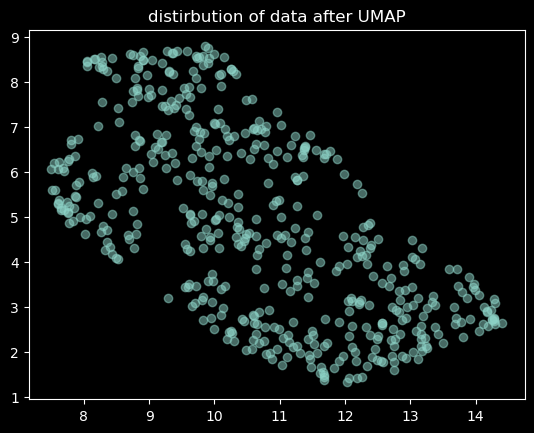

In [48]:
plt.scatter(df_umap[:, 0], df_umap[:, 1], alpha=0.5)
plt.title("distirbution of data after UMAP")
plt.plot()

## 5.3 K-Means Clustering and Silhouette Score

### 5.3.1 K-means

In [49]:
estimators2 = [
	KMeans(n_clusters=i) for i in range(2,11) 
]
n_clusters2 = [i for i in range(2,11)]
silhouette_scores2 = []

for est in estimators2:
	est.fit(df_umap)
	labels = est.labels_
	# silhouette score for all samples
	silhouette_avg = silhouette_score(df_umap, labels)
	silhouette_scores2.append(silhouette_avg)

d:\Anacoda\envs\cmpt733\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
d:\Anacoda\envs\cmpt733\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
d:\Anacoda\envs\cmpt733\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
d:\Anacoda\envs\cmpt733\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_

### 5.3.2 Silhouette Score
**Observations**

Unlike PCA-reduced data, with UMAP reduction and clustering, k = 2 yields that highest Silhouette score.

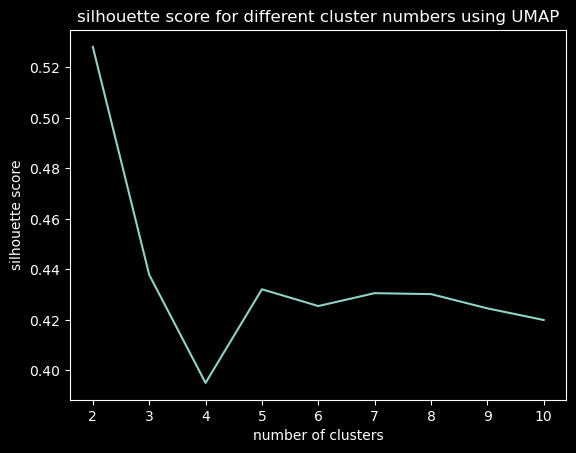

In [50]:
plt.plot(n_clusters2, silhouette_scores2)
plt.title("silhouette score for different cluster numbers using UMAP")
plt.xlabel("number of clusters")
plt.ylabel("silhouette score")
plt.show()

## 5.4 Cluster Interpretation
+ In the last section, we got the highest Silhouette score with k = 2, so in this section, we use 2 as our final number of expressions.
+ Instead of only visualizing the 2-cluster situation, I decided to also visualize the labeld data points when k is larger for analysis.

**Observation**
+ Unlike PCA, UMAP reduced and clustered data has some overlapping in the plot. As UMAP is a non-linear dimensionality reduction technique that tends to maintain both global and local structures. But the cluster overlapping is a sign of bad separation between data points.
+ The data visualization of UMAP-reduced data also has a unique distribution that is different from the PCA-reduced data. There are some holes in the main data swamp, which I believe is related to the local structure preservation of UMAP. 
+ When k = 9, the data points seems to mixed up together, and each cluster does not have a clear boundary. This aligns with the Silhouette score results. 

### 5.4.1 Visualization of the labeled clusters

In [51]:
def vis_cluster2(n_cluster = 2, est = estimators2[0]):
	labels = est.labels_
	plt.scatter(df_umap[:, 0], df_umap[:, 1], alpha=1, c=labels)
	plt.title("UMAP clustering data visualization with "+str(n_cluster)+" clusters")
	plt.plot()

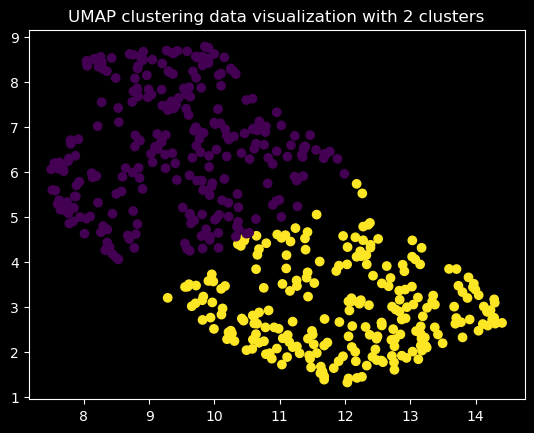

In [52]:
vis_cluster2(n_cluster= 2, est=estimators2[0])

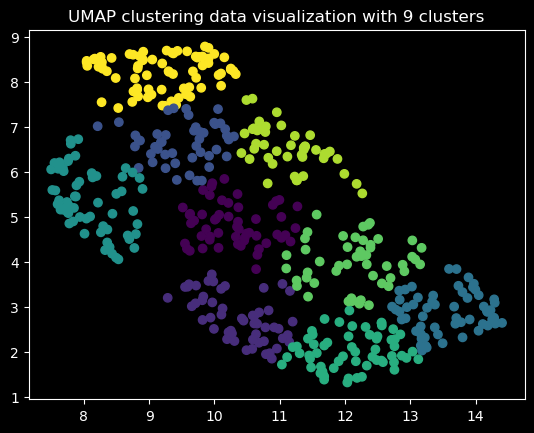

In [53]:
vis_cluster2(n_cluster= 9, est=estimators2[7])

### 5.4.2 Labeling the clusters
Since we only have 2 clusters generated, this time I inpsect the images in each cluster one-by-one, and tries to give it a reasonable label. **You can refer to grouped images inside the support_images file.**

**Group Labels**
1. group 0: with 82 not-happy faces and 138 happy faces.
2. group 1: with 141  not-happy faces and 139 happy faces.

The human-labeling result indicates that the clustering result has some separation on the clearly happy faces and other facial expressions that is not happy. But in general, the clustering algorithm failed to give a reasonable grouping regarding to human facial expressions.

In [54]:
# get the index of images for each cluster
def get_labels(n_cluster = 2):
	est = estimators2[ce_map[n_cluster]]
	labels = est.labels_
	indices = []
	for sel_label in range(n_cluster):
		indices.append([i for i, val in enumerate(labels) if val == sel_label])
	return indices

indices2 = get_labels()

output_directory = "UMAP outputs"
os.makedirs(output_directory, exist_ok=True)
# store the images according to their labels for inspection
for group_index, sublist in enumerate(indices2):
    # Create a directory for the current group
    group_directory = os.path.join(output_directory, f"group_{group_index}")
    os.makedirs(group_directory, exist_ok=True)
    
    # Iterate through each index in the sublist
    for index in sublist:
        # Check if the index is within the range of filenames
        if 0 <= index < len(img_fns):
            # Get the filename corresponding to the index
            filename = img_fns[index]
            # Construct the full path to the image
            img_full_path = os.path.join(IMG_PATH, filename)
            # Check if the file exists
            if os.path.exists(img_full_path):
                # Define the destination path for the image
                dest_path = os.path.join(group_directory, filename)
                # Copy the image to the corresponding group directory
                copyfile(img_full_path, dest_path)
            else:
                print(f"Image {filename} does not exist.")
        else:
            print(f"Index {index} is out of range.")

Index 500 is out of range.
Index 501 is out of range.
Index 502 is out of range.
Index 506 is out of range.
Index 503 is out of range.
Index 504 is out of range.
Index 505 is out of range.


# 6. Summarization
In this project, I explored two different dimensional reduction methods: PCA and UMAP. And used K-means to perform clustering on a human faice image dataset. These two different dimensional reduction process yields different best number of clusters. According to the data visualization of the labeled data, no clear separation clusters are observed. And with a careful inspection on each group's images, the performance of the clustering result is not ideal for both two methods, but UMAP has a better clustering results than PCA. Here are some possible reason for the poor performance:
1. **Feature selection**: Though I experimented different feature combinations, I found that landmark locations in 2D and 3D can get a good PCA variance in a direction, but the final clustered outcome also has no clear facial expression groups. The reason is that the faicial landmarks are easily affected by human apperance, so it is not an ideal feature for expression clustering. In order to group facial images in a finer granularity, other expression related features should be provided to K-means to get a better clustering result. In our task, the provided features is only enough to support a binary classification.
2. **Cluserting Algorithm**: In this experiment, we only tried one clustering algoithm which is K-means. Perhaps density based algorithm like DBSCAN can give a better result.
3. **Cluster Interpretation**: Though for human, the clustering result is not reasonable, there may exist some underlying pattern captured by the algorithm which is not closely related to facial expressions. 